# Exploratory Data Analysis

Let's examine the dataset, it's structure and quality.

In [1]:
import pandas as pd
import numpy as np
from datetime import time
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
from pandas_profiling import ProfileReport
print('Pandas ver:',pd.__version__)

Pandas ver: 1.1.3


In [2]:
pd_coll=pd.read_csv('Data-collisions.csv')
pd_coll['INCDATE']=pd.to_datetime(pd_coll['INCDATE'])
pd_coll['INCDTTM']=pd.to_datetime(pd_coll['INCDTTM'])
pd_coll.head()

C:\Users\dedi\anaconda3\envs\Cloud\lib\site-packages\IPython\core\interactiveshell.py:2714: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


## Profiling

I'm starting with [pandas-profiler](https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/index.html), an amazing tool I found recently: 

In [77]:
profile=ProfileReport(pd_coll, title='Collisions Profile Report')
profile.to_widgets()

In [4]:
#profile.to_file('Col-profile.html') #saving to separate html for later check.

In [5]:
pd_coll.shape

(194673, 38)

In [6]:
pd_coll.dtypes

SEVERITYCODE                    int64
X                             float64
Y                             float64
OBJECTID                        int64
INCKEY                          int64
COLDETKEY                       int64
REPORTNO                       object
STATUS                         object
ADDRTYPE                       object
INTKEY                        float64
LOCATION                       object
EXCEPTRSNCODE                  object
EXCEPTRSNDESC                  object
SEVERITYCODE.1                  int64
SEVERITYDESC                   object
COLLISIONTYPE                  object
PERSONCOUNT                     int64
PEDCOUNT                        int64
PEDCYLCOUNT                     int64
VEHCOUNT                        int64
INCDATE           datetime64[ns, UTC]
INCDTTM                datetime64[ns]
JUNCTIONTYPE                   object
SDOT_COLCODE                    int64
SDOT_COLDESC                   object
INATTENTIONIND                 object
UNDERINFL   

## Severity Code
SEVERITYCODE is the label we have to predict.

In [7]:
pd_coll['SEVERITYCODE'].value_counts()

1    136485
2     58188
Name: SEVERITYCODE, dtype: int64

As you can see below there are only two state in this dataset:<br>
1 - Prop damage<br>
2 - Injury

It is rather inbalanced as only around 30% of the rows have severity code of 2

## Collision types

There are two different coding to describe collisions:

In [8]:
pd_coll['COLLISIONTYPE'].value_counts()

Parked Car    47987
Angles        34674
Rear Ended    34090
Other         23703
Sideswipe     18609
Left Turn     13703
Pedestrian     6608
Cycles         5415
Right Turn     2956
Head On        2024
Name: COLLISIONTYPE, dtype: int64

In [9]:
pd_coll['SDOT_COLCODE'].value_counts()

11    85209
14    54299
16     9928
0      9787
28     8856
24     6518
13     5852
26     4741
18     3104
15     1604
12     1440
51     1312
29      479
21      181
56      180
27      166
54      139
23      124
48      107
31      104
25      102
34       93
64       75
69       69
33       53
55       50
66       23
22       17
32       12
53        9
44        8
61        7
35        6
58        5
68        4
36        4
46        3
52        2
47        1
Name: SDOT_COLCODE, dtype: int64

It is interesting that more than 40% of collisions are categorized as side swipe (code 11 and 12). The next most frequent is collision from the back while one car stopped (code 14). These covers 70% of all collisions.

In [10]:
pd_coll.loc[pd_coll['SDOT_COLCODE']==11,'COLLISIONTYPE'].value_counts()

Angles        32091
Parked Car    14667
Left Turn     12783
Sideswipe     12051
Other          7331
Right Turn     1975
Head On        1751
Rear Ended      482
Cycles          134
Pedestrian       33
Name: COLLISIONTYPE, dtype: int64

Wait, there is something wrong here. It seems that Collision type and State Collision Code (SDOT) are quite different.Here you cen see one example: SDOT code is 11 (Side Swipe), but Collision Type is rather various, coding only 14% of these incidents as Side Swipe.

Let's have a look at it on a graph:

<AxesSubplot:xlabel='SDOT_COLCODE', ylabel='COLLISIONTYPE'>

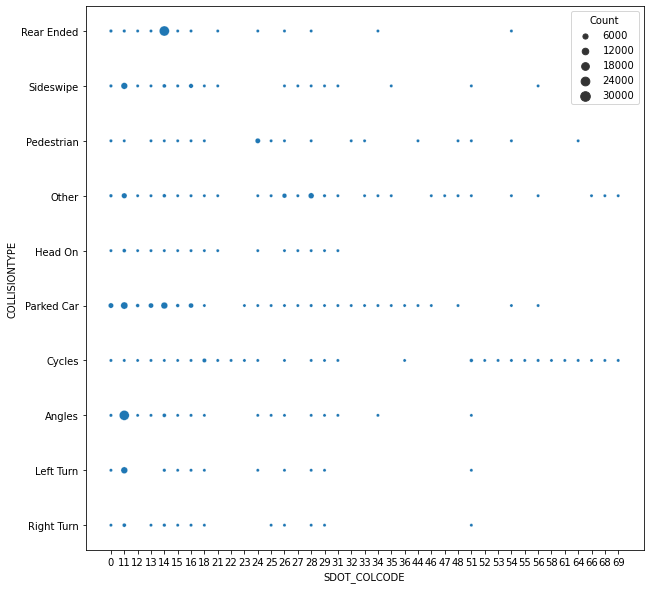

In [11]:
pd_scatter=pd_coll.value_counts(subset=['SDOT_COLCODE','COLLISIONTYPE'])
pd_scatter=pd_scatter.reset_index().rename({0:'Count'},axis=1).sort_values('SDOT_COLCODE')
pd_scatter['SDOT_COLCODE']=pd_scatter['SDOT_COLCODE'].astype(str)

plt.figure(figsize=(10,10))
sns.scatterplot(data=pd_scatter,x='SDOT_COLCODE',y='COLLISIONTYPE',size='Count',sizes=(10,100))


It seems that the correlation between the two collision codes are rather light. I would not use either of them for prediction until I can't tell the reason behind these differences.

## Timespan
Two date attributes can be found in the set, let's explore them.

In [12]:
print("Earliest incident: ",pd_coll['INCDTTM'].min())
print("Last incident: ",pd_coll['INCDTTM'].max())

Earliest incident:  2004-01-01 00:00:00
Last incident:  2020-05-20 00:00:00


Let's have a look at the quarterly distribution:

In [13]:
resampler='Q'
years = mdates.YearLocator()   # every year
months = mdates.MonthLocator(interval=3)  # every quarter
years_fmt = mdates.DateFormatter('%Y')

pd_res=pd_coll[['SEVERITYCODE','INCDTTM']].set_index('INCDTTM')
pd_res2=pd_res.resample(resampler).count().rename({'SEVERITYCODE':'Total'},axis=1)
pd_res2['Injury']=pd_res[pd_res['SEVERITYCODE']==2].resample(resampler).count()
pd_res2['No Injury']=pd_res[pd_res['SEVERITYCODE']==1].resample(resampler).count()
pd_res2.head()

,Total,Injury,No Injury
INCDTTM,,,
2004-03-31,2899,846,2053
2004-06-30,3299,1056,2243
2004-09-30,3199,999,2200
2004-12-31,2468,746,1722
2005-03-31,3262,992,2270


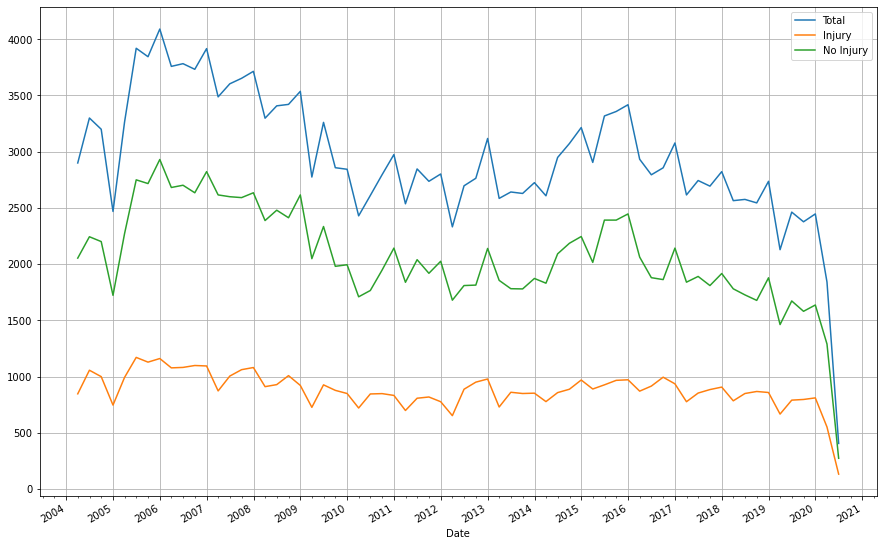

In [14]:
fig,ax=plt.subplots()
pd_res2.plot(ax=ax,figsize=(15,10),x_compat=True)

ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)
ax.set_xlabel('Date')
ax.grid(True)
fig.autofmt_xdate()

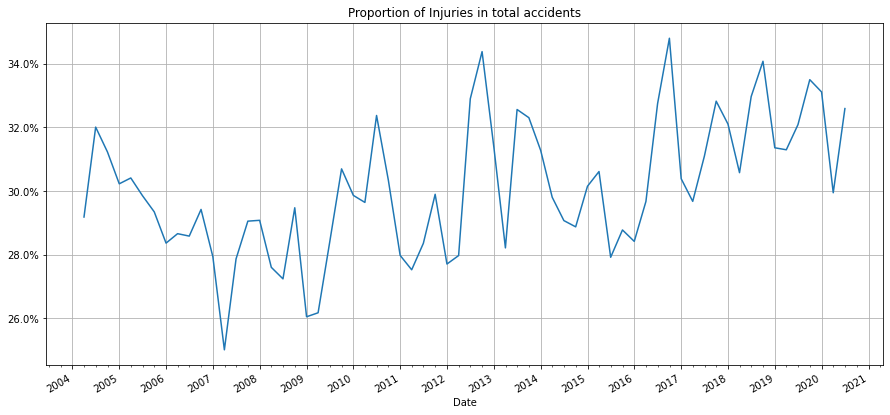

In [15]:
fig,ax=plt.subplots()
(pd_res2['Injury']/pd_res2['Total']).plot(ax=ax,figsize=(15,7),x_compat=True)

ax.set_title('Proportion of Injuries in total accidents')
ax.set_xlabel('Date')
ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0))
ax.xaxis.set_major_locator(years)
ax.xaxis.set_major_formatter(years_fmt)
ax.xaxis.set_minor_locator(months)
ax.grid(True)
fig.autofmt_xdate()

It is interesting that there is a slight downward trend in terms of total accidents, the number of injuries doesn't fully follow it. There is a slight increase in percentage of injuries.

I'm checking whether there is any difference between **INCDTTM** and **INCDATE**:

In [16]:
pd_coll[pd_coll['INCDTTM'].dt.date!=pd_coll['INCDATE'].dt.date]

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR


**INCDTTM** and **INCDATE** are the same, except INCDTTM contains some time data as well.

It's a usual assumption that some days of the week (Friday, weekend, Monday?) are different from the others, let's check it:

In [54]:
pd_coll['Weekday']=pd_coll['INCDATE'].dt.dayofweek #0: Monday ... 6:Sunday
pd_coll['Weekday'].value_counts(sort=False)

0    26338
1    28556
2    28778
3    29324
4    32333
5    27389
6    21955
Name: Weekday, dtype: int64

<AxesSubplot:title={'center':'Collisions per weekdays w/wo injuries'}, xlabel='Weekday'>

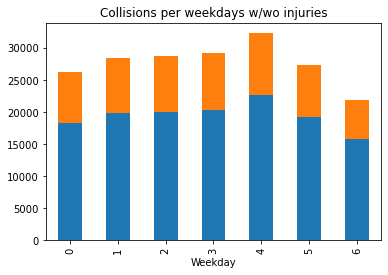

In [75]:
#counting per incident types per day:
gb=pd_coll.groupby(['Weekday','SEVERITYCODE'])['SEVERITYCODE.1'].count().rename('Percentage').to_frame()
gb.unstack().plot(kind='bar',stacked=True,legend=False,title='Collisions per weekdays w/wo injuries')

In [76]:
gb_perc=gb/gb.groupby(level=0).sum() #converting to percentage
gb_perc

Percentage
Weekday SEVERITYCODE            
0       1               0.697281
        2               0.302719
1       1               0.694250
        2               0.305750
2       1               0.695705
        2               0.304295
3       1               0.692470
        2               0.307530
4       1               0.704358
        2               0.295642
5       1               0.706196
        2               0.293804
6       1               0.722022
        2               0.277978

To sum it up there are slightly less accidents on Sunday than on any other day, and the proportion of injuries are also significantly lower. The most collisions happen on Friday but the proportion of injuries are not higher than on other days. So weekend may be a good candidate for a predictor.

## Inspecting NaN values

Let's start with a simple heatmap with a quick visual check of NaN frequency. In this plot white lines indicating NaN:

<AxesSubplot:>

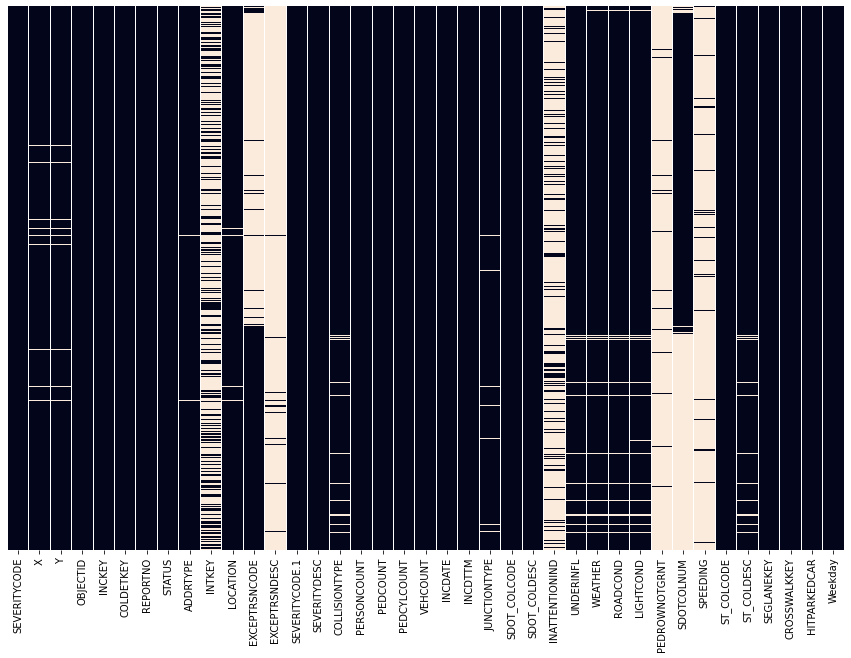

In [18]:
plt.figure(figsize=(15,10))
sns.heatmap(pd_coll.isna(),cbar=False,yticklabels=False)

In [19]:
pd_coll.isna().sum()

SEVERITYCODE           0
X                   5334
Y                   5334
OBJECTID               0
INCKEY                 0
COLDETKEY              0
REPORTNO               0
STATUS                 0
ADDRTYPE            1926
INTKEY            129603
LOCATION            2677
EXCEPTRSNCODE     109862
EXCEPTRSNDESC     189035
SEVERITYCODE.1         0
SEVERITYDESC           0
COLLISIONTYPE       4904
PERSONCOUNT            0
PEDCOUNT               0
PEDCYLCOUNT            0
VEHCOUNT               0
INCDATE                0
INCDTTM                0
JUNCTIONTYPE        6329
SDOT_COLCODE           0
SDOT_COLDESC           0
INATTENTIONIND    164868
UNDERINFL           4884
WEATHER             5081
ROADCOND            5012
LIGHTCOND           5170
PEDROWNOTGRNT     190006
SDOTCOLNUM         79737
SPEEDING          185340
ST_COLCODE            18
ST_COLDESC          4904
SEGLANEKEY             0
CROSSWALKKEY           0
HITPARKEDCAR           0
Weekday                0
dtype: int64

There are several attributes with missing data in the dataset, but it is not always 'real' missing data! E.g. as you can see below,  **SPEEDING** or **INATTENTIONIND** NaN actually means *No* as the only value in this column is *'Y'*. In this case NaN is valuable information.

So all columns with missing data must be examined how to handle.

In [20]:
pd_coll['SPEEDING'].value_counts()

Y    9333
Name: SPEEDING, dtype: int64

In [21]:
pd_coll['PEDROWNOTGRNT'].value_counts()

Y    4667
Name: PEDROWNOTGRNT, dtype: int64

In [22]:
pd_coll['INATTENTIONIND'].value_counts()

Y    29805
Name: INATTENTIONIND, dtype: int64

Column **UNDERINFL** is a bit more messy, you can find Y,N,0,1 and NaN. But I'm assuming that NaN is again equivalent to No:

In [23]:
pd_coll['UNDERINFL'].value_counts()

N    100274
0     80394
Y      5126
1      3995
Name: UNDERINFL, dtype: int64

In [24]:
pd_coll['WEATHER'].value_counts()

Clear                       111135
Raining                      33145
Overcast                     27714
Unknown                      15091
Snowing                        907
Other                          832
Fog/Smog/Smoke                 569
Sleet/Hail/Freezing Rain       113
Blowing Sand/Dirt               56
Severe Crosswind                25
Partly Cloudy                    5
Name: WEATHER, dtype: int64

It is interesting that there are both *Unknown* and *NaN* values in **ROADCOND** (and there is also an *Other* value). By examining NaN values (see below) these entries seem valid. So I tend to handle these three values as normal road conditions (*Dry* in this dataset)

In [25]:
pd_coll['ROADCOND'].value_counts()

Dry               124510
Wet                47474
Unknown            15078
Ice                 1209
Snow/Slush          1004
Other                132
Standing Water       115
Sand/Mud/Dirt         75
Oil                   64
Name: ROADCOND, dtype: int64

In [26]:
pd_coll[pd_coll['ROADCOND'].isna()][['SEVERITYDESC','LOCATION']]

,SEVERITYDESC,LOCATION
15,Property Damage Only Collision,9TH AVE BETWEEN LENORA ST AND BLANCHARD ST
36,Property Damage Only Collision,OLIVE WAY BETWEEN 6TH AVE AND 7TH AVE
53,Injury Collision,BEACON AVE S AND BEACON WR N AVE S
60,Property Damage Only Collision,OLSON PL SW BETWEEN 1ST AVE S AND 2ND AVE SW
75,Property Damage Only Collision,21ST AVE SW AND SW CAMBRIDGE ST
...,...,...
194620,Property Damage Only Collision,NW MARKET ST BETWEEN 15TH AVE NW AND 17TH AVE NW
194625,Property Damage Only Collision,ALASKAN WY VI NB BETWEEN S HOLGATE ST AND SR99...
194646,Property Damage Only Collision,BROADWAY BETWEEN CHERRY ST AND E COLUMBIA ST
194654,Property Damage Only Collision,15TH AVE NE AND NE 125TH ST


Junction type might be a useful attribute:

In [27]:
pd_coll['JUNCTIONTYPE'].value_counts()

Mid-Block (not related to intersection)              89800
At Intersection (intersection related)               62810
Mid-Block (but intersection related)                 22790
Driveway Junction                                    10671
At Intersection (but not related to intersection)     2098
Ramp Junction                                          166
Unknown                                                  9
Name: JUNCTIONTYPE, dtype: int64

In [28]:
pd_coll['LIGHTCOND'].value_counts()

Daylight                    116137
Dark - Street Lights On      48507
Unknown                      13473
Dusk                          5902
Dawn                          2502
Dark - No Street Lights       1537
Dark - Street Lights Off      1199
Other                          235
Dark - Unknown Lighting         11
Name: LIGHTCOND, dtype: int64

Similarly, **LIGHTCOND** has several generic values: *Unknown* (13473) *Other* (235) and *NaN* (5170). I wonder if these  can be replaced by some meaningful values by using the time of the accident.

In [29]:
print(pd_coll[pd_coll['LIGHTCOND'].isna()]['INCDTTM'])
print('Count of missing time: ',(pd_coll[pd_coll['LIGHTCOND'].isna()]['INCDTTM']==time()).count())

15       2020-04-20
36       2020-03-13
53       2020-04-18
60       2020-04-20
75       2019-07-08
            ...    
194620   2018-12-21
194625   2018-12-16
194646   2018-12-13
194654   2019-01-10
194655   2019-01-20
Name: INCDTTM, Length: 5170, dtype: datetime64[ns]
Count of missing time:  5170


Unfortunately it seems if Light conditions are not entered the time of the accident is also missing...

In [30]:
print(pd_coll[pd_coll['LIGHTCOND']=='Unknown']['INCDTTM'].dt.time)
print('No. of missing time: ',pd_coll[(pd_coll['LIGHTCOND']=='Unknown')&(pd_coll['INCDTTM'].dt.time==time())]['INCDTTM'].count())

19        00:00:00
23        06:20:00
26        15:24:00
52        11:53:00
66        21:15:00
            ...   
194476    23:00:00
194541    18:00:00
194574    08:03:00
194603    09:50:00
194618    12:00:00
Name: INCDTTM, Length: 13473, dtype: object
No. of missing time:  2001


In [31]:
print(pd_coll[pd_coll['LIGHTCOND']=='Other']['INCDTTM'].dt.time)
print('No. of missing time: ',pd_coll[(pd_coll['LIGHTCOND']=='Other')&(pd_coll['INCDTTM'].dt.time==time())]['INCDTTM'].count())

197       00:00:00
281       00:00:00
295       00:00:00
788       13:00:00
1765      08:00:00
            ...   
192906    15:58:00
193538    18:00:00
193598    15:21:00
194314    02:59:00
194660    12:52:00
Name: INCDTTM, Length: 235, dtype: object
No. of missing time:  37


In case of *Unknown* and *Other* light conditions the results are mixed. If Light Conditions is *Unknown* time is missing in 2001 rows out of 13473. If it is *Other* time is missing only 37 times.

Actually we found a "hidden" NaN, that is the time part of the incident. Let's check how many of them are missing:

In [32]:
pd_coll[pd_coll['INCDTTM'].dt.time==time()]['INCDTTM'].count()

30526

So, around in 15% of the rows only the date of incident is entered without time. That's quite unfortunate as my initial assumption was that the probability of more serious injury is higher at certain period of the day (during night most probably) so time would be a strong predictor. It is doubtful now if it can be used at all.

It might be also true for certain days (weekends, holidays?). It needs to be tested, but I may extract attributes from this column.

## Geodata

The exact location of the accident isalmost always filled, let's have a look at them.

In [33]:
import folium
import folium.plugins

In [34]:
pd_cleaned=pd_coll.dropna(subset=['X','Y'])
m_colors=['','green','red']

In [35]:
map=folium.Map(location=[37.0,-96.0],zoom_start=4)
coll_group=folium.plugins.FastMarkerCluster([]).add_to(map)

pd_cleaned.head(10000).apply(lambda c: folium.Marker( #I'm keeping the first 10000 to save time, but I saved a full map
    location=[c['Y'],c['X']],
    icon=folium.Icon(icon='ambulance',color='white',icon_color=m_colors[c['SEVERITYCODE']],prefix='fa'),
    tooltip=str(c['INCDTTM'])+'<br>'+c['SEVERITYDESC']
    ).add_to(coll_group),
    axis=1)

map.add_child(coll_group)
map

In [36]:
#map.save('collisions.html') #to save the full dataset on map for later analysis

So it is just a localized dataset, containing collisions in Seattle only. That was not mentioned in the metadata.